In [1]:
# Import bibliotek
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from itables import show, options
from sklearn.linear_model import LinearRegression
import branca.colormap as cm
from branca.colormap import linear
from folium import Map, CircleMarker

In [2]:
# Wczytanie danych
df = pd.read_csv('who_with_coords.csv')

In [3]:
# Wyświetlenie pierwszych 10 wierszy
df.head(10)

,WHO Region,ISO3,WHO Country Name,City or Locality,Measurement Year,PM2.5 (μg/m3),PM10 (μg/m3),NO2 (μg/m3),PM25 temporal coverage (%),PM10 temporal coverage (%),NO2 temporal coverage (%),Reference,Number and type of monitoring stations,Version of the database,Status,Latitude,Longitude
0,Eastern Mediterranean Region,AFG,Afghanistan,Kabul,2019,119.77,NaN,NaN,18.0,NaN,NaN,"U.S. Department of State, United States Enviro...",NaN,2022,NaN,34.526643,69.184908
1,European Region,ALB,Albania,Durres,2015,NaN,17.65,26.63,NaN,NaN,83.961187,European Environment Agency (downloaded in 2021),NaN,2022,NaN,41.313255,19.446235
2,European Region,ALB,Albania,Durres,2016,14.32,24.56,24.78,NaN,NaN,87.932605,European Environment Agency (downloaded in 2021),NaN,2022,NaN,41.313255,19.446235
3,European Region,ALB,Albania,Elbasan,2015,NaN,NaN,23.96,NaN,NaN,97.853881,European Environment Agency (downloaded in 2021),NaN,2022,NaN,41.112679,20.082086
4,European Region,ALB,Albania,Elbasan,2016,NaN,NaN,26.26,NaN,NaN,96.049636,European Environment Agency (downloaded in 2021),NaN,2022,NaN,41.112679,20.082086
5,European Region,ALB,Albania,Elbasan,2017,NaN,NaN,24.70,NaN,NaN,89.292237,European Environment Agency (downloaded in 2021),NaN,2022,NaN,41.112679,20.082086
6,European Region,ALB,Albania,Korce,2015,30.34,45.31,NaN,NaN,NaN,NaN,European Environment Agency (downloaded in 2021),NaN,2022,NaN,40.615897,20.777219
7,European Region,ALB,Albania,Korce,2016,28.64,40.21,12.52,NaN,NaN,89.287341,European Environment Agency (downloaded in 2021),NaN,2022,NaN,40.615897,20.777219
8,European Region,ALB,Albania,Vlore,2014,NaN,15.25,NaN,NaN,NaN,NaN,European Environment Agency (downloaded in 2021),NaN,2022,NaN,40.470760,19.491272
9,European Region,ALB,Albania,Vlore,2015,NaN,19.39,14.18,NaN,NaN,78.470320,European Environment Agency (downloaded in 2021),NaN,2022,NaN,40.470760,19.491272


## Opis atrybutów:
- WHO Region - Region pomiaru
- ISO3 - trzyliterowy kod kraju z którego brany jest pomiar
- WHO Country Name - Kraj pomiaru
- City or Locality - miasto/miejscowośc pomiaru
- Measurement Year - Rok pomiaru
- PM2.5 (μg/m3) - Stężenie pyłów PM2.5 w mikrogramach na metr sześcienny
- PM10 (μg/m3) - Stężenie pyłów PM10 w mikrogramach na metr sześcienny.
- NO2 (μg/m3) - Stężenie dwutlenku azotu (NO2) w mikrogramach na metr sześcienny
- PM25 temporal coverage (%) - Pokrycie czasowe danych dotyczących pyłów PM2.5 (%)
- PM10 temporal coverage (%) - Pokrycie czasowe danych dotyczących pyłów PM10 (%)
- NO2 temporal coverage (%) - Pokrycie czasowe danych dotyczących dwutlenku azotu (%)
- Reference - Odwołanie do źródła danych
- Number and type of monitoring stations - Liczba i typ stacji monitorujących
- Version of the database - Wersja bazy danych
- Status - Status danych
- Latitude - szerkość geograficzna miasta
- Longitude - długość geograficzna miasta

In [4]:
# Sprawdzenie typów danych
print(df.dtypes)

WHO Region                                 object
ISO3                                       object
WHO Country Name                           object
City or Locality                           object
Measurement Year                            int64
PM2.5 (μg/m3)                             float64
PM10 (μg/m3)                              float64
NO2 (μg/m3)                               float64
PM25 temporal coverage (%)                float64
PM10 temporal coverage (%)                float64
NO2 temporal coverage (%)                 float64
Reference                                  object
Number and type of monitoring stations     object
Version of the database                     int64
Status                                    float64
Latitude                                  float64
Longitude                                 float64
dtype: object


## EDA globalna

In [5]:
pollutants = ['PM2.5 (μg/m3)', 'PM10 (μg/m3)', 'NO2 (μg/m3)']

In [6]:
# Podsumowanie statystyczne wszystkich kolumn numerycznych
df.describe()

,Measurement Year,PM2.5 (μg/m3),PM10 (μg/m3),NO2 (μg/m3),PM25 temporal coverage (%),PM10 temporal coverage (%),NO2 temporal coverage (%),Version of the database,Status,Latitude,Longitude
count,32191.000000,15048.000000,21109.000000,22200.000000,7275.000000,5381.000000,19890.000000,32191.000000,0.0,30982.000000,30982.000000
mean,2015.579354,22.920320,30.533252,20.619336,90.794096,90.583500,93.696804,2021.744214,NaN,38.904831,21.149295
std,2.752654,17.925906,29.312756,12.133388,14.872681,13.816311,10.451751,1.051897,NaN,17.845924,57.178598
min,2000.000000,0.010000,1.040000,0.000000,0.000000,2.568493,1.923077,2016.000000,NaN,-53.162569,-159.319160
25%,2014.000000,10.350000,16.980000,12.000000,88.595890,87.945205,93.207763,2022.000000,NaN,35.020274,2.127312
50%,2016.000000,16.000000,22.000000,18.800000,97.000000,96.039000,96.369863,2022.000000,NaN,44.017764,11.971298
75%,2018.000000,31.000000,31.300000,27.160000,99.000000,98.938000,98.926941,2022.000000,NaN,49.326185,33.338366
max,2021.000000,191.900000,540.000000,210.680000,100.000000,100.000000,100.000000,2022.000000,NaN,69.651635,178.442166


Najstarsze pomiary zostały zarejestrowane w roku 2000, zaś najnowsze datuje się na rok 2021. W przypadku wartości PM2.5, PM10, NO₂ widoczne jest duże odchylenie standardowe, szczególnie w przypadku PM10, gdzie jest ono prawie równe średniej. Średnie pokrycie czasowe dla wszystkich parametrów (PM2.5, PM10, NO₂) wynosi ponad 90%, co oznacza, że dane pokrywają zdecydowaną większość okresu pomiarowego. Świadczy to o ich wysokiej kompletności, mimo obecności brakujących danych.

In [7]:
missing_values = df.isnull().sum()
missing_percent = (missing_values / len(df)) * 100

missing_summary = pd.DataFrame({
    'Liczba braków': missing_values,
    'Procent braków (%)': missing_percent.round(2)
})

In [8]:
print(missing_summary)

                                        Liczba braków  Procent braków (%)
WHO Region                                          1                0.00
ISO3                                                0                0.00
WHO Country Name                                    0                0.00
City or Locality                                    0                0.00
Measurement Year                                    0                0.00
PM2.5 (μg/m3)                                   17143               53.25
PM10 (μg/m3)                                    11082               34.43
NO2 (μg/m3)                                      9991               31.04
PM25 temporal coverage (%)                      24916               77.40
PM10 temporal coverage (%)                      26810               83.28
NO2 temporal coverage (%)                       12301               38.21
Reference                                           5                0.02
Number and type of monitoring stations

### Wartości brakujące
- WHO Region - jedna wartośc brakująca łatwa do uzpełniania na podstawie kraju w brakującym rekordzie
- PM2.5 (μg/m3) - około połwy danych brakujących patrząc na całość zbioru
- PM10 (μg/m3) - około 1/3 danych brakujących
- NO2 (μg/m3) - również około 1/3 danych brakujących
- PM25 temporal coverage (%) - 77% danych brakujących, więc pomimo wysokiej średniej pokrycia wynikającej ze statystyk dla wartości które są w zbiorze, tak duża ilośc wartości brakujących powoduje porzucenie wcześniejszego stwierdznia o wysokiej kompletności danych
- PM10 temporal coverage (%) - 83% danych brakujących, podobna sytuacja jak w pokryciu czasowym PM2.5
- NO2 temporal coverage (%) - tutaj tylko około 40% wartości brakujących
- Reference	- brakuje 5 rekordów, nie są to jednak istotne pod kątem analizy wartości
- Number and type of monitoring stations - 72% wartości brakujących, cięzki do uzupełnienia, poniewąż poza liczbą stacji powinien się też znajdować typ stacji z jakiej brane były pomiary
- Status - same wartości brakujące, można więc usunąc tę kolumnę

In [9]:
# Ususnięcie kolumny 'Status'
df = df.drop(columns=['Status'])

In [10]:
df[df['WHO Region'].isna()]

,WHO Region,ISO3,WHO Country Name,City or Locality,Measurement Year,PM2.5 (μg/m3),PM10 (μg/m3),NO2 (μg/m3),PM25 temporal coverage (%),PM10 temporal coverage (%),NO2 temporal coverage (%),Reference,Number and type of monitoring stations,Version of the database,Latitude,Longitude
24778,NaN,LIE,Liechtenstein,Vaduz,2010,NaN,17.88,23.59,NaN,96.164,98.265,European Environment Information and Observati...,NaN,2022,47.139286,9.522796


In [11]:
print(df['WHO Region'].unique())

['Eastern Mediterranean Region' 'European Region' 'Region of the Americas'
 'Western Pacific Region' 'South East Asia Region' 'African Region' nan]


Lichtenstein, bo dla tego państwa nie jest przypisany żaden region według listy WHO (https://apps.who.int/violence-info/Countries%20and%20areas%20by%20WHO%20region%20-%2012bfe12.pdf) nie znajduje się w żadnym regionie. Na potrzeby nalizy przypisano go jednak do regionu europejskiego, czyli 'European Region'.

In [12]:
df['WHO Region'] = df['WHO Region'].fillna('European Region')

### Histogramy

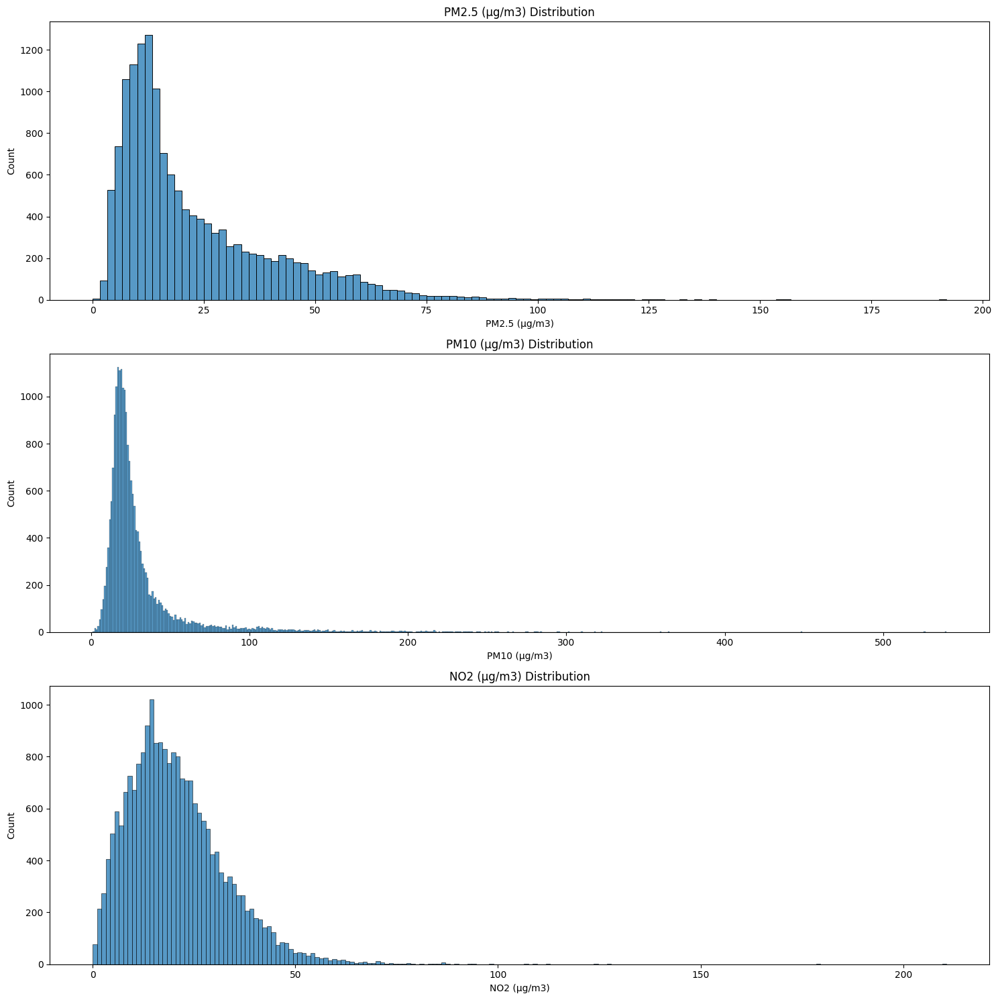

In [13]:
pollutants = ['PM2.5 (μg/m3)', 'PM10 (μg/m3)', 'NO2 (μg/m3)']
fig, axes = plt.subplots(len(pollutants), 1, figsize=(15, 15))

for i, pollutant in enumerate(pollutants):
    sns.histplot(df[pollutant], ax=axes[i])
    axes[i].set_title(f'{pollutant} Distribution')

plt.tight_layout()
plt.show()

### Wykresy pudełkowe

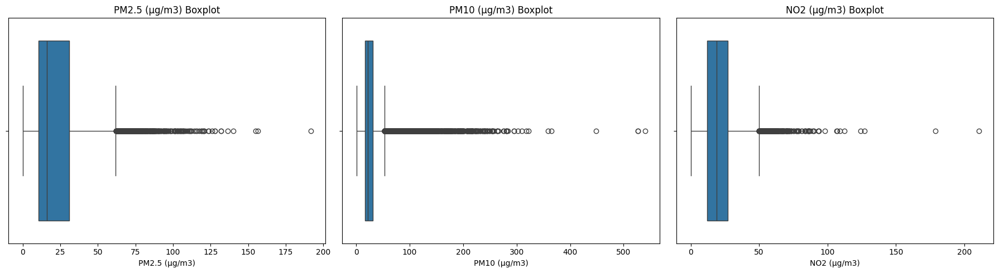

In [14]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for i, pollutant in enumerate(pollutants):
    sns.boxplot(x=df[pollutant], ax=axes[i]).set_title(f'{pollutant} Boxplot')

plt.tight_layout()
plt.show()

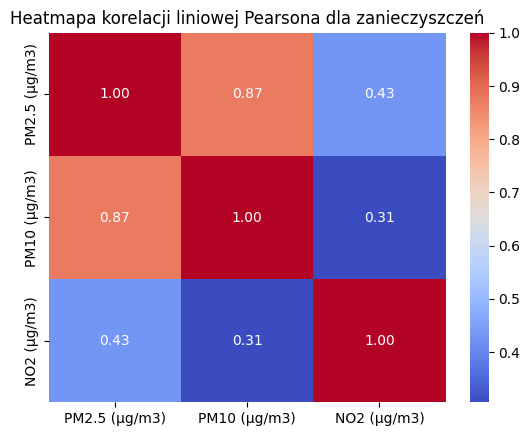

In [15]:
# Korelacja
correlation_matrix = df[pollutants].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Heatmapa korelacji liniowej Pearsona dla zanieczyszczeń')
plt.show()


Zmienne PM2.5, PM10 i NO₂ mają rozkłady silnie lewostronne, co sugeruje dużą liczbę wartości odstających. Potwierdzają to wykresy boxplot dla tych zmiennych, na których widoczna jest znaczna liczba outlierów. Analiza korelacji liniowej Pearsona wykazuje silną zależność pomiędzy PM2.5 a PM10.

## EDA na poziomie Regionu

In [16]:
pd.set_option('display.max_columns', None)  # pokaż wszystkie kolumny

In [17]:
print("Statystyki opisowe dla regionów:")
df.groupby("WHO Region")[pollutants].describe()

Statystyki opisowe dla regionów:


PM2.5 (μg/m3)                              \
                                     count       mean        std   min   
WHO Region                                                               
African Region                       125.0  27.257120  20.435911  4.05   
Eastern Mediterranean Region         221.0  38.063258  19.843202  8.12   
European Region                     7591.0  14.002193   6.315753  0.01   
Region of the Americas              2120.0  11.389410   8.387063  1.80   
South East Asia Region               553.0  42.841212  23.432654  7.00   
Western Pacific Region              4438.0  40.324123  18.012102  2.10   

                                                              PM10 (μg/m3)  \
                                  25%    50%      75%     max        count   
WHO Region                                                                   
African Region                15.1600  22.86  31.9200  132.00        160.0   
Eastern Mediterranean Region  26.2000  33.00  44.8300  140.00        288.0   
European Region                9.8500  12.81  17.0050   71.52      16279.0   
Region of the Americas         6.0000   8.00  14.0000   66.65       2266.0   
South East Asia Region        27.3600  36.50  50.0000  191.90       1419.0   
Western Pacific Region        28.1125  39.11  51.7275  156.32        697.0   

                                                                              \
                                    mean        std    min      25%      50%   
WHO Region                                                                     
African Region                 51.906625  38.927441   6.05  25.3100   41.390   
Eastern Mediterranean Region  121.317951  76.441168  18.00  74.5975  109.800   
European Region                23.013879  10.934350   1.04  16.5000   20.740   
Region of the Americas         30.677423  18.969999   3.65  17.0000   26.085   
South East Asia Region         94.626582  51.400386   8.50  57.0000   84.000   
Western Pacific Region         32.781478  27.102957   5.30  16.2000   22.400   

                                              NO2 (μg/m3)             \
                                  75%     max       count       mean   
WHO Region                                                             
African Region                 57.890  193.43       124.0  23.160242   
Eastern Mediterranean Region  149.025  540.00       149.0  45.715101   
European Region                26.600  142.63     16959.0  20.389040   
Region of the Americas         39.090  132.19      2142.0  15.757890   
South East Asia Region        118.000  322.00      2210.0  22.099986   
Western Pacific Region         44.000  253.00       616.0  31.970357   

                                                                               
                                    std   min      25%    50%     75%     max  
WHO Region                                                                     
African Region                15.597572  3.70  12.0975  19.51  31.045  124.28  
Eastern Mediterranean Region  29.840508  5.50  26.4700  38.05  55.820  210.68  
European Region               11.319598  0.02  12.0800  18.98  27.000  107.00  
Region of the Americas        10.055134  0.00   8.5000  14.00  20.950   83.94  
South East Asia Region        12.845567  2.00  13.0000  19.33  28.000   87.50  
Western Pacific Region        14.094483  2.22  22.8900  33.00  41.000   77.23

Na podstawie podstawowych miar statystycznych widoczne jest że Region Europejski i Amerykasnki mają mniejsze wartości zanieczyszczeń od reszty świata. Najwyższe wartości zarówno te maksymalne oraz średnia jak i mediany widoczne są na Bliskim Wschodzie i Azji południowo-wschodniej

### Brakujące dane - Regiony

In [18]:
df['WHO Region'].value_counts()

WHO Region
European Region                 20293
Western Pacific Region           4798
Region of the Americas           3957
South East Asia Region           2514
Eastern Mediterranean Region      438
African Region                    191
Name: count, dtype: int64

In [19]:
missing_percentage_by_region = df.groupby('WHO Region').apply(
    lambda x: x.drop(columns=['WHO Region']).isna().mean() * 100
)
print(missing_percentage_by_region)

                              ISO3  WHO Country Name  City or Locality  \
WHO Region                                                               
African Region                 0.0               0.0               0.0   
Eastern Mediterranean Region   0.0               0.0               0.0   
European Region                0.0               0.0               0.0   
Region of the Americas         0.0               0.0               0.0   
South East Asia Region         0.0               0.0               0.0   
Western Pacific Region         0.0               0.0               0.0   

                              Measurement Year  PM2.5 (μg/m3)  PM10 (μg/m3)  \
WHO Region                                                                    
African Region                             0.0      34.554974     16.230366   
Eastern Mediterranean Region               0.0      49.543379     34.246575   
European Region                            0.0      62.593012     19.780220   
Region of th

C:\Users\mikos\AppData\Local\Temp\ipykernel_20704\2529595783.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  missing_percentage_by_region = df.groupby('WHO Region').apply(


Przyglądnięto się brakującym danym przy podziel na Region i wusnuto nastepujące wnioski:
- Region Afrykański (African Region) - W regionie afrykańskim braki nie są duże maksymalnie 35% jeśli chodzi o poziom NO2, dane dla tegio regionu mają też dosyć spore pokrycie, tych rekordów jest jednak bardzo mało, poniewż tylko 181 i mała ilośc wartości brakujących może wynikać z faktu iż przy tak małej stacji istona jest każda wartośc
- Region Wschodniego Morza Śródziemnego (Eastern Mediterranean Region) - tutaj danych brakuje więcej niż w przypadku Afryki, szczególnie w przypadku NO2 (65%), dane mają też małe pokrycie ze względu na dużo ilośc danych brakujących dotyczących informacji o pokryciu, przy rónież małej ilości danych (438)
- Region Europejski (European Region) - duża ilośc wartości brakujących w przypadku PM2.5 oraz duża ilośc wartości brakujących dotyczących pokrycia PM2.5 i PM10 przy sporej ilośc wszystkich danych (20293 rekordy). W przypadku tego regionu duża ilośc braków danych może wynikać ze sporej ilości stacji pomiarowych.
- Region Region Amrykański (Region of the Americas) - Duża ilośc wartości brakujących dotyczących pokrycia danych w przypadku wszystkich parametrów. Braki danych dla wszystkich parametrów na poziomie 45%
- Region Azji południowo-wschodniej (South East Asia Region) - Duza ilośc wartości brakujących dla PM2.5 oraz pokrycia tych wartości na poziomie około 80%, średnia ilośc wartości brakujących dla PM10 i ich pokrycia na poziomie około 45% oraz mała ilośc wartości brakujących dla No2 i ich pokrycia na poziomie około 10%. Fakt ten może oznaczać że w tym regionie skupia się na monitorowaniu poziomu NO2.
- Region PAcyfiku (Western Pacific Region ) - duża ilośc wartości brakujących w przypadku Pm10 i No2 i i ch pokrycia oraz mała ilośc wartości brakujących dla Pm2.5 i ich pokrycia. MFakt ten może oznaczać że w tym regionie skupia się na monitorowaniu poziomu PM2.5.

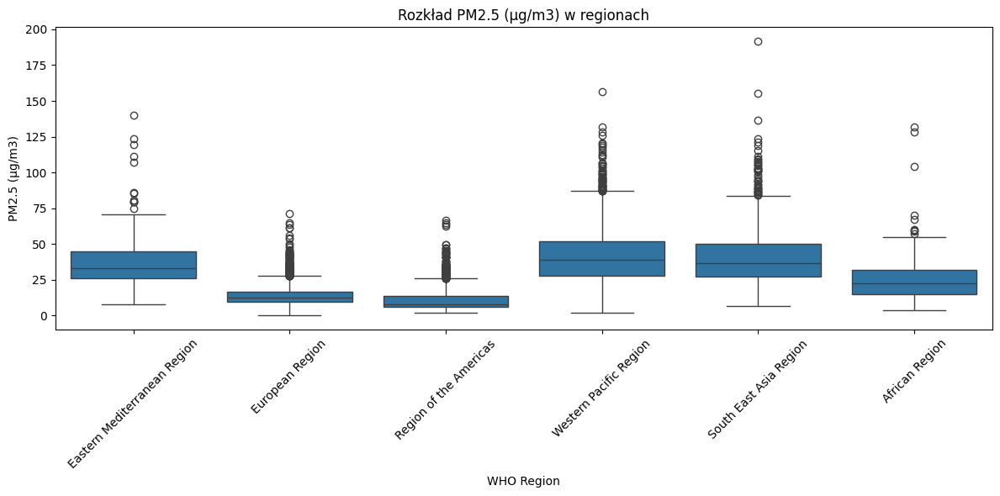

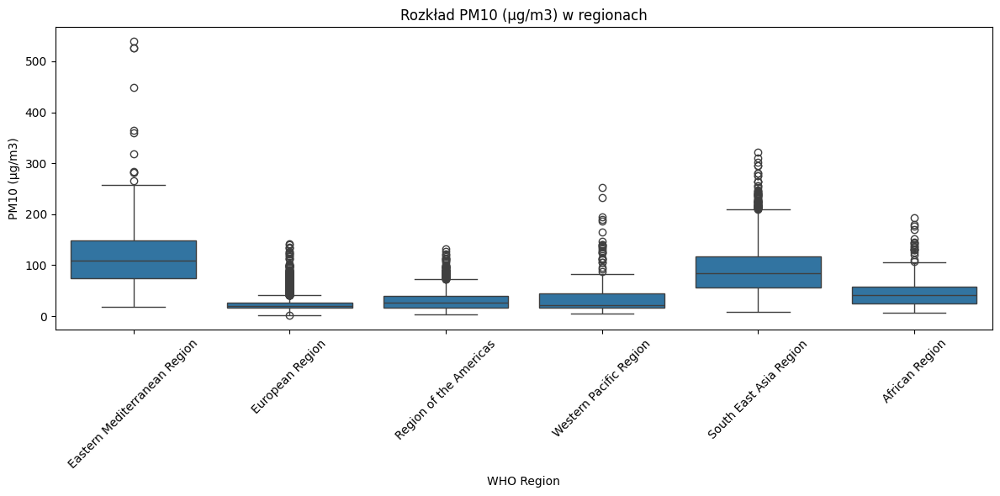

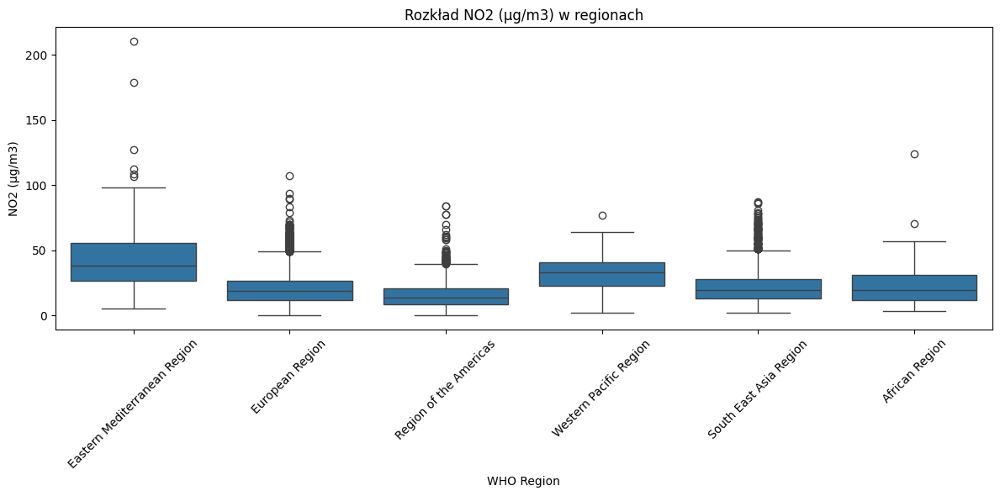

In [20]:
for col in pollutants:
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=df, x="WHO Region", y=col)
    plt.title(f"Rozkład {col} w regionach")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

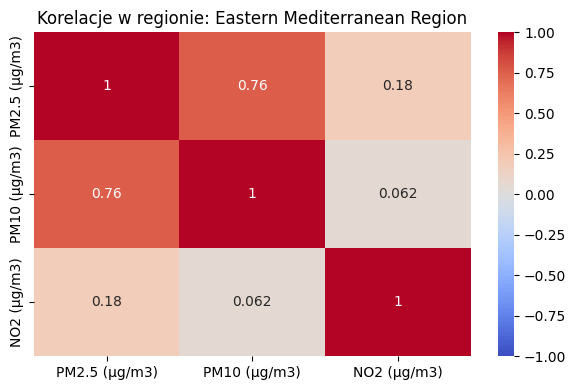

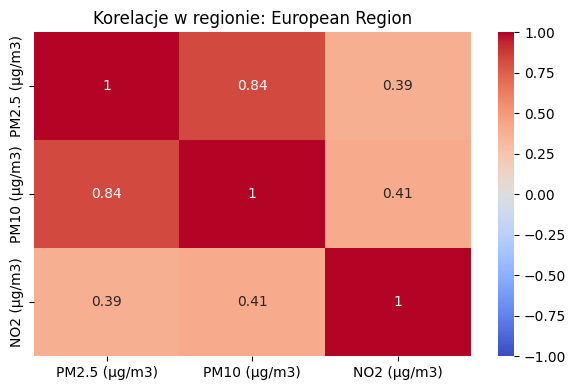

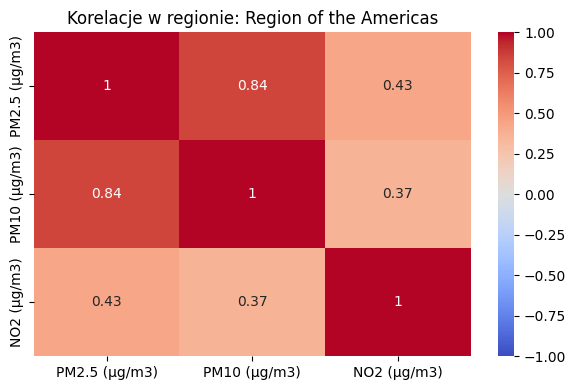

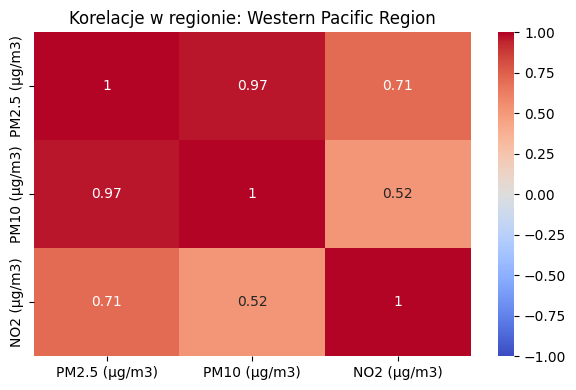

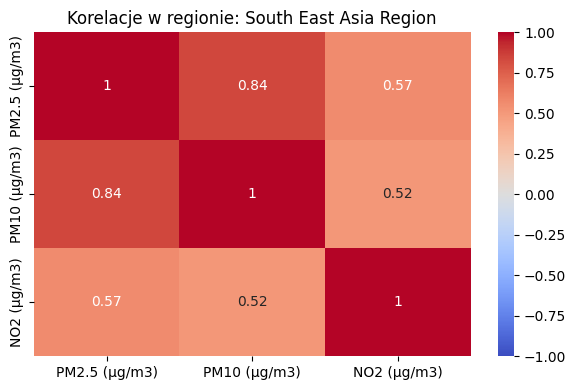

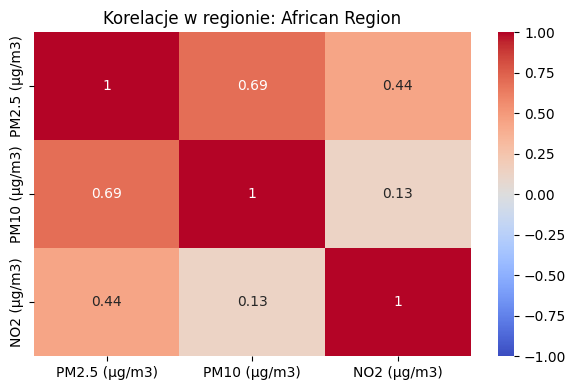

In [21]:
regions = df['WHO Region'].dropna().unique()

for region in regions:
    region_df = df[df['WHO Region'] == region][pollutants]
    corr = region_df.corr()
    plt.figure(figsize=(6, 4))
    sns.heatmap(corr, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
    plt.title(f"Korelacje w regionie: {region}")
    plt.tight_layout()
    plt.show()

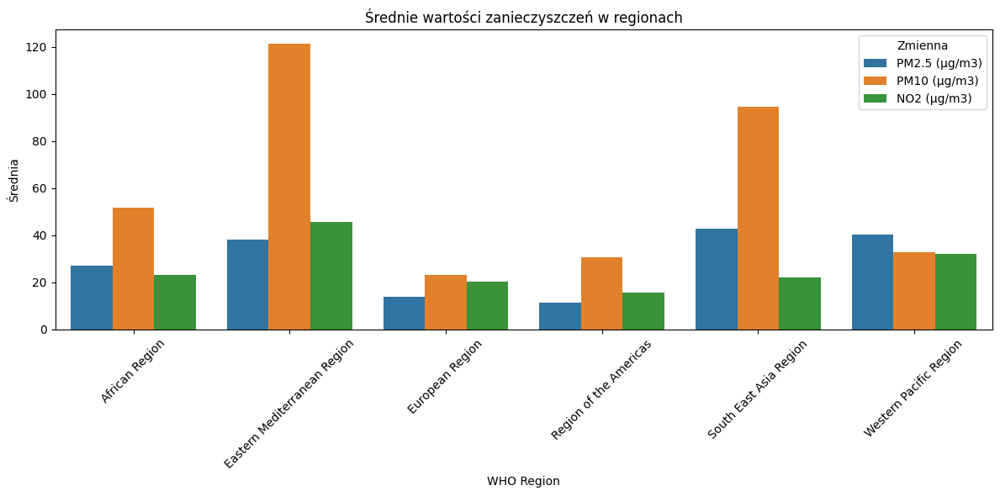

In [22]:
avg_values_region = df.groupby("WHO Region")[pollutants].mean().reset_index()
avg_values_melted = avg_values_region.melt(id_vars='WHO Region', var_name='Zmienna', value_name='Średnia')

plt.figure(figsize=(12, 6))
sns.barplot(data=avg_values_melted, x='WHO Region', y='Średnia', hue='Zmienna')
plt.title("Średnie wartości zanieczyszczeń w regionach")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Wykres średnich wartości zanieczyszczeń oraz rozkłądy na wykresach boxplot potwierdzają to co widoczne było w podstawowych statystykach, jeżeli chodzi o pozomy zanieczyszczeń. Regiony takie jak Europa, Ameryki, Azja południowo-wschodnia, które posiadają dużo obserwacji posiadają dużo wartości odstających. Dla poszczególnych regionow tak jak w danych globalnych potwierdza się wysoka korelacja liniowa Pearsona pomiędzy PM2.5 i PM10. 

## EDA na poziomie kraju

In [23]:
# Konfiguracja globalna itables
options.classes = "display compact"
options.lengthMenu = [10, 25, 50, 100, -1]  # -1 oznacza "wszystkie"
options.pageLength = 25  # Domyślna liczba wierszy na stronie
options.scrollX = True
options.columnDefs = [{"orderable": True, "targets": "_all"}] 

In [24]:
# Grupowanie z obliczeniem średniej, mediany, max i liczby obserwacji
agg_df_country = df.groupby("WHO Country Name")[pollutants].agg(['mean', 'median', 'max', 'count']).reset_index()

In [25]:
# Spłaszczenie nazw kolumn
agg_df_country.columns = ['WHO Country Name'] + [f"{col[0].split()[0]}_{col[1]}" for col in agg_df_country.columns[1:]]

In [26]:
# Filtrowanie krajów z co najmniej 10 obserwacjami PM2.5
agg_df_filtered_country = agg_df_country[agg_df_country["PM2.5_count"] >= 1]

In [27]:
# Wyświetlenie filtrowanej tabeli
show(agg_df_filtered_country.sort_values("PM2.5_mean", ascending=False))

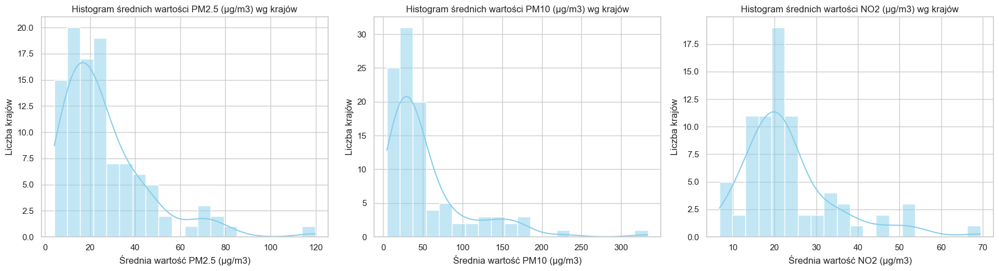

In [28]:
# Oblicz średnie wartości dla każdego kraju (z zachowaniem NaN)
country_means = df.groupby("WHO Country Name")[pollutants].mean()

# Ustaw styl wykresów
sns.set(style="whitegrid")
plt.figure(figsize=(18, 5))

# Tworzenie osobnych histogramów
for i, pollutant in enumerate(pollutants):
    plt.subplot(1, 3, i+1)
    sns.histplot(data=country_means[pollutant].dropna(), kde=True, bins=20, color='skyblue')
    plt.title(f'Histogram średnich wartości {pollutant} wg krajów')
    plt.xlabel(f'Średnia wartość {pollutant}')
    plt.ylabel('Liczba krajów')

plt.tight_layout()
plt.show()

In [29]:
# Obliczenie średnich wartości dla każdego kraju
country_means = df.groupby('WHO Country Name')[pollutants].mean().reset_index()

# Dodanie przypisanego regionu do każdego kraju
country_regions = df[['WHO Country Name', 'WHO Region']].drop_duplicates()
country_means = country_means.merge(country_regions, on='WHO Country Name', how='left')

# Obliczenie średnich wartości dla każdego regionu
region_means = df.groupby('WHO Region')[pollutants].mean().reset_index()
region_means = region_means.rename(columns={col: f'{col}_region_mean' for col in pollutants})

# Połączenie danych krajowych ze średnimi regionalnymi
comparison_df = country_means.merge(region_means, on='WHO Region', how='left')

for col in pollutants:
    country_col = col
    region_col = f'{col}_region_mean'

    # Różnica między krajem a regionem
    comparison_df[f'{col}_diff'] = comparison_df[country_col] - comparison_df[region_col]

    # Ocena kierunku różnicy
    comparison_df[f'{col}_comparison'] = comparison_df[f'{col}_diff'].apply(
        lambda x: 'above' if x > 0 else ('below' if x < 0 else 'equal')
    )

show(comparison_df)

Przeprowadzono agregację danych na poziomie kraju oraz obliczono wartości średnie, mediany i maksymalne dla wszystkich zanieczyszczeń. Na histogramach widoczne jest, że wiele krajów mieści się w przyjętych normach dla zanieczyszczeń, tj. 25 μg/m³ dla PM2.5, 40 μg/m³ dla PM10 i 40 μg/m³ dla NO₂.
Biblioteka iTables umożliwiła wygodne zwizualizowanie tych zagregowanych wartości, pozwalając na interaktywne przeglądanie tabel, np. poprzez sortowanie wartości od największych do najmniejszych, co ułatwia identyfikację najbardziej zanieczyszczonych krajów. Dokanao również analizy jak kraje wypadają na tle całego regionu, czy zanieczyszczenie jest więskze czy mniejsze.

## EDA na poziomie miast

In [30]:
# Grupowanie z obliczeniem średniej, mediany, max i liczby obserwacji
agg_df_city = df.groupby("City or Locality")[pollutants].agg(['mean', 'median', 'max', 'count']).reset_index()

In [31]:
# Spłaszczenie nazw kolumn
agg_df_city.columns = ['City or Locality'] + [f"{col[0].split()[0]}_{col[1]}" for col in agg_df_city.columns[1:]]

In [32]:
# Filtrowanie krajów z co najmniej 10 obserwacjami PM2.5
agg_df_filtered_city = agg_df_city[agg_df_city["PM2.5_count"] >= 1]

In [33]:
# Wyświetlenie filtrowanej tabeli
show(agg_df_filtered_city.sort_values("PM2.5_mean", ascending=False))

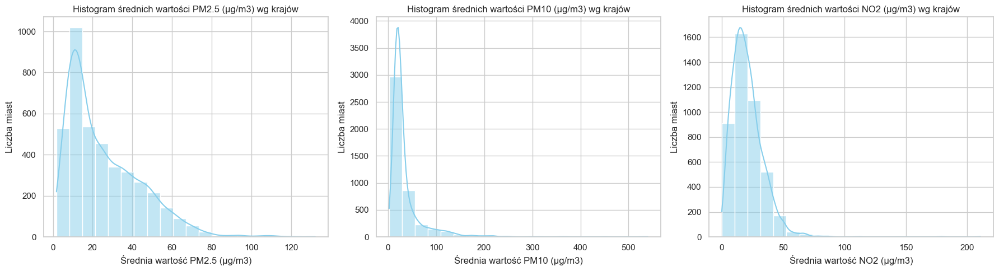

In [34]:
# Oblicz średnie wartości dla każdego kraju (z zachowaniem NaN)
city_means = df.groupby("City or Locality")[pollutants].mean()

# Ustaw styl wykresów
sns.set(style="whitegrid")
plt.figure(figsize=(18, 5))

# Tworzenie osobnych histogramów
for i, pollutant in enumerate(pollutants):
    plt.subplot(1, 3, i+1)
    sns.histplot(data=city_means[pollutant].dropna(), kde=True, bins=20, color='skyblue')
    plt.title(f'Histogram średnich wartości {pollutant} wg krajów')
    plt.xlabel(f'Średnia wartość {pollutant}')
    plt.ylabel('Liczba miast')

plt.tight_layout()
plt.show()

Takie samo postępowanie jak dla krajów zastosowano w przypadku miast.

In [35]:
df_cleaned = df.dropna(subset=['Latitude', 'Longitude'])
city_avg = df_cleaned.groupby(['WHO Region', 'WHO Country Name', 'City or Locality', 'Latitude', 'Longitude'])[pollutants].mean().reset_index()

In [36]:
for pollutant in pollutants:
    # Sprawdź czy są jakiekolwiek dane
    if city_avg[pollutant].notna().sum() == 0:
        continue

    # Skala logarytmiczna — stosujemy log1p
    values = city_avg[pollutant]
    log_values = np.log1p(values.dropna())

    # Tworzenie colormapy na podstawie logarytmów
    vmin, vmax = log_values.min(), log_values.max()
    colormap = linear.YlOrRd_09.scale(vmin, vmax)
    colormap.caption = f'Log(1 + {pollutant})'

    # Mapa bazowa
    m = folium.Map(location=[20, 0], zoom_start=2, tiles='CartoDB positron')

    for _, row in city_avg.iterrows():
        value = row[pollutant]
        if pd.notna(value):
            log_val = np.log1p(value)
            color = colormap(log_val)

            CircleMarker(
                location=[row['Latitude'], row['Longitude']],
                radius=5,
                color=color,
                fill=True,
                fill_opacity=0.8,
                popup=f"{row['City or Locality']}, {row['WHO Country Name']}: {pollutant} = {value:.1f}"
            ).add_to(m)

    colormap.add_to(m)
    display(m)

W osobnym skrypcie pobrano współrzędne miast i zwizualizowano wartości zanieczyszczeń na interaktywnej mapie. Dla kolorów znaczników zastosowano skalę logarytmiczną, aby zminimalizować wpływ wartości odstających. Na mapach, szczególnie w przypadku PM2.5 i PM10, kolory znaczników dobrze odwzorowują poszczególne regiony. Widoczne jest największe zanieczyszczenie w Azji oraz mniejsze w Europie i Ameryce Północnej.

## Uzupełnienie wartości brakujących

Zdecydownao się na uzupełnienie wartości brakujących dla Pm2.5 i PM10 przy użyciu regresji liniowej osobno dla każdego regionu WHO. Dla każdej grupy regionalnej trenowany jest model regresji najpierw PM2.5 jako funkcja PM10 (dla przypadków, gdzie PM2.5 brakuje, ale PM10 jest dostępne), następnie PM10 jako funkcja PM2.5 (dla odwrotnej sytuacji).

In [37]:
# Iteracja po regionach
for region in df['WHO Region'].dropna().unique():
    df_region = df[df['WHO Region'] == region]

    # --- PM2.5 ~ PM10 ---
    train_pm25 = df_region.dropna(subset=pollutants)
    if len(train_pm25) >= 2:  # minimum do regresji
        model = LinearRegression()
        model.fit(train_pm25[['PM10 (μg/m3)']], train_pm25['PM2.5 (μg/m3)'])

        # Wiersze do uzupełnienia
        mask = (df['WHO Region'] == region) & (df['PM2.5 (μg/m3)'].isna()) & (df['PM10 (μg/m3)'].notna())
        df.loc[mask, 'PM2.5 (μg/m3)'] = model.predict(df.loc[mask, ['PM10 (μg/m3)']])

    # --- PM10 ~ PM2.5 ---
    train_pm10 = df_region.dropna(subset=pollutants)
    if len(train_pm10) >= 2:
        model = LinearRegression()
        model.fit(train_pm10[['PM2.5 (μg/m3)']], train_pm10['PM10 (μg/m3)'])

        # Wiersze do uzupełnienia
        mask = (df['WHO Region'] == region) & (df['PM10 (μg/m3)'].isna()) & (df['PM2.5 (μg/m3)'].notna())
        df.loc[mask, 'PM10 (μg/m3)'] = model.predict(df.loc[mask, ['PM2.5 (μg/m3)']])

df = df[~((df['WHO Region'] == 'Western Pacific Region') & df['NO2 (μg/m3)'].isna())]


Usunięto wartości brakujące dla regionu „Western Pacific Region” ze względu na dużą ilośc wartości brakujących. Pomimo zabużenia rozkładu przez tak uzupełnione dane jest ono konieczne, aby dane mogły póxniej zostać użyte np. do modelu w uczeniu maszynowym.

In [38]:
df = df[~((df['WHO Region'] == 'Western Pacific Region') & df['NO2 (μg/m3)'].isna())]

Pozostałe wartości brakujące uzupełniono medianą, gdyż jest ona odporna na wartości odstające, których jest sporo w danych

In [39]:
for col in pollutants:
    df[col] = df.groupby('WHO Region')[col].transform(lambda x: x.fillna(x.median()))

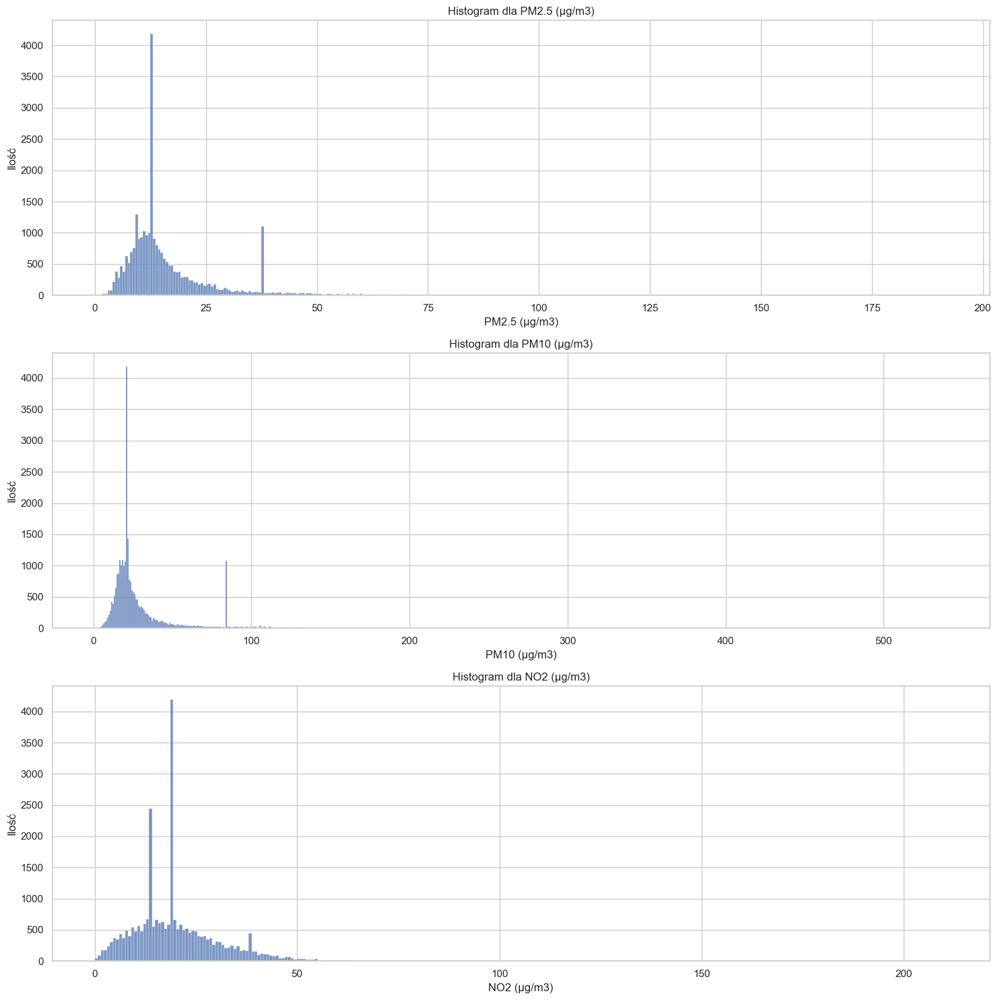

In [40]:
fig, axes = plt.subplots(len(pollutants), 1, figsize=(15, 15))

for i, pollutant in enumerate(pollutants):
    sns.histplot(df[pollutant], ax=axes[i])
    axes[i].set_title(f'Histogram dla {pollutant}')
    axes[i].set_ylabel('Ilość')

plt.tight_layout()
plt.show()

In [41]:
df_cleaned = df.dropna(subset=['Latitude', 'Longitude'])
city_avg = df_cleaned.groupby(['WHO Region', 'WHO Country Name', 'City or Locality', 'Latitude', 'Longitude'])[pollutants].mean().reset_index()

## Porównie analizy na róznych poziomach generalizacji

Przeprowadzona analiza na róznych poziomach generalizacji pozwala na porównaie tych podjeść:
- Analiza globalna - pozwala na ogólne zoobrazowanie danych. Jednak w przypadku danych jak te dotyczących zanieczyszczenia na całym świecie jest to niewystarczające aby dobrze przeprowadzić analizę ze względu na zróżnicowanie rregionów ich podjeście do przemysłu oraz politykę dotyczącą dbania o powietrze,
- Analiza na poziomie regionów - ta anliza pozwala na porównaie zanieczyszczeń między sporymi obszarami geograficznymi wydzielonymi przez WHO, pozwala to na uchwycenie ogólnych trendów panujących w tych regionach. Pozwoliło to również na porównanie między sobą poszczególnych regionów pod względem zanieczyszczenia oraz zidentyfikować najmniej i najbardziej zanieczyszczone regiony.
- Analiza na poziomie kraju - analiza ta pozwoliła zobrazować jak wygląda zanieczyszczenie w danym kraju oraz jak wygląda on na tle całego regionu , czy zanieeczyszczenie jest większe, czy mniejsze niż w regionie
- Analiza na poziomie miasta - analiza na tym poziomie pozwoliła na zidentyfikowanie miast z największym i najmniejszym zanieczyszczeniem, pozwoiło to również na zwizualizowanie danych dotyczących zanieczyszczenia na interaktywnej mapie. Na mapie można zaobserwować koncentrację najwyższych poziomów zanieczyszczenia w miastach azjatyckich i na Bliskim wschodzie, podczas gdy w miastach europejskich i północnoamerykańskich wartości te są zwykle niższe.

Podsumowując, moim zdaniem najwięcej do całego EDA wniosła analiza na poziomie Regionu, gdyż pokazała róznicę między sporymi obszarami geograficznymi oraz analiza na poziomie miast gdyż pozwoliła na zwizualizowanie zanieczyszczeń na mapie, a w obszarze danego państwa nie było znacznych róznic między miastami.

## Zastosowanie danych w uczneiu maszynowym

Dane te mogą zostać wykorzystane w prwedidywaniu poziomu zanieczyszczeń przy pomocy regresji np. prognozowanie PM2.5 na podstawie PM10 i NO2, zwłaszcza dla miejsc w których pomiary obejmują dłuższy okres. 
Można dokonac klasyfikacji regionów lub krajów na podstawie poziomu zanieczyszczeń (niskie, średnie, wysokie)
Ciekwawym podejściem wydaje się również przeprowadzenie klasteryzacji punktów pomiarówych na podstawie zanieczyszceń i sprawdzenie jak pokrywają się z faktycznymi regionami geograficznymi przedstawionymi przez WHO.

## Wnisoki

Przeprowadzona anliza pozwoliła na zidentyfikowanie regionów oraz krajów z największym zanieczyszczeniem powietrza, pozwoliła też na dobranie odpowiedniego sposobu uzupełnienia wartości brakujących. Dokananie analizy na rówżnych poziomach generalizacji umożliwiło na zauważanenie zarówno gloabalnych trendów w zanieczyszczeniach jak i lokalnych wyjątków, które mogły zostać pominięty w analizie globalnej jak itej na poziomie regionów. Udało się również zauważyć potencjalne zastosowania analizowanych danych w uczeniu maszynowym.